In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import time
import tensorflow as tf
from random import shuffle
import glob

In [6]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['STFangsong']
mpl.rcParams['figure.figsize'] = (20, 3)

In [7]:
%matplotlib inline

In [8]:
from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util

from object_detection.utils import ops as utils_ops

In [9]:
from numbers import Real
def to_severity(lesions_num:Real) -> int:
    """
    The Hayashi criterion
    The appropriate divisions of inflammatory eruptions of half of the face to decide classifications were:     0-5, "mild";
        6-20, "moderate";
        21-50, "severe";
        >=50, "very severe"
    Reference:
    [1] Hayashi N, Akamatsu H, Kawashima M, et al. Establishment of grading criteria for acne severity[J]. The Journal of dermatology, 2008, 35(5): 255-260.
    [2] https://www.ncbi.nlm.nih.gov/pubmed/18477223
    """
    if lesions_num <= 5:
        return 0
    elif lesions_num <= 20:
        return 1
    elif lesions_num <= 50:
        return 2
    else:
        return 3

In [10]:
parent_dir = "/export/servers/wenhao/acne_detection/models/research/latest_models/"

In [11]:
faster_rcnn_resnet101_small_frozen_graph = os.path.join(parent_dir, "faster_rcnn_resnet101_small/frozen_inference_graph.pb")
faster_rcnn_resnet101_large_frozen_graph = os.path.join(parent_dir, "faster_rcnn_resnet101_large/frozen_inference_graph.pb")
faster_rcnn_inception_v2_small_frozen_graph = os.path.join(parent_dir, "faster_rcnn_inception_v2_small/frozen_inference_graph.pb")
faster_rcnn_inception_v2_large_frozen_graph = os.path.join(parent_dir, "faster_rcnn_inception_v2_large/frozen_inference_graph.pb")
ssd_mobilenet_v1_large_frozen_graph = os.path.join(parent_dir, "ssd_mobilenet_v1_large/frozen_inference_graph.pb")

In [12]:
PATH_TO_FROZEN_GRAPH = faster_rcnn_resnet101_large_frozen_graph

PATH_TO_LABELS = '/export/servers/data/acne04/acne.pbtxt'

In [13]:
PATH_TO_FROZEN_GRAPH

'/export/servers/wenhao/acne_detection/models/research/latest_models/faster_rcnn_resnet101_large/frozen_inference_graph.pb'

In [14]:
os.path.exists(PATH_TO_FROZEN_GRAPH)

True

In [15]:
os.path.isfile(PATH_TO_FROZEN_GRAPH)

True

## faster_rcnn_resnet101_large

In [16]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

In [17]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=1, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [18]:
def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Get handles to input and output tensors
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [ 'num_detections', 'detection_boxes', 'detection_scores', 'detection_classes', 'detection_masks' ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(tensor_name)
            if 'detection_masks' in tensor_dict:
                # The following processing is only for single image
                detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
                # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
                real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Follow the convention by adding back the batch dimension
                tensor_dict['detection_masks'] = tf.expand_dims( detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict, feed_dict={image_tensor: np.expand_dims(image, 0)})

            # all outputs are float32 numpy arrays, so convert types as appropriate
            output_dict['num_detections'] = int(output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict[
              'detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict

In [118]:
def detect_and_draw_old(image_path=None, face_img=None, min_score_thresh=0.5, show=False):
    if image_path is not None:
        if not os.path.exists(image_path):
            return

        print(image_path.split("/")[-1])
        #   image = Image.open(image_path)
        # the array based representation of the image will be used later in order to prepare the
        # result image with boxes and labels on it.
        #   image_np = load_image_into_numpy_array(image)
        image = cv2.imread(image_path)[...,::-1]
        image_np = cv2.imread(image_path)[...,::-1]
        image_origin = cv2.imread(image_path)[...,::-1]
    elif face_img is not None:
        image = face_img.copy()
        image_np = face_img.copy()
        image_origin = face_img.copy()
    else:
        raise ValueError
    print(image.size, image_np.shape, image_origin.shape)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    
    start = time.time()
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    print('detection cost {} second(s)'.format(time.time()-start))
    
    detected_indices = np.where(output_dict['detection_scores'] >= min_score_thresh)[0]
    detected_scores = output_dict['detection_scores'][detected_indices]
    detected_boxes = output_dict['detection_boxes'][detected_indices]
    
    fl_w, fl_h = image.shape[:2]
    mask_acne = np.zeros(shape=(fl_w, fl_h), dtype=np.uint8)
    for ymin, xmin, ymax, xmax in detected_boxes:
        ymin, xmin, ymax, xmax = int(round(ymin*fl_w)), int(round(xmin*fl_h)), int(round(ymax*fl_w)), int(round(xmax*fl_h))
        mask_acne[ymin:ymax, xmin:xmax] = 1
    _, labels = cv2.connectedComponents(mask_acne, 1, 4)
    labels = np.unique(labels)
    acne_num = max(0, len(labels) - 1)
    detected_acne_num = acne_num
    
    if not show:
        return detected_scores, detected_boxes, detected_acne_num
    
#     print("output_dict = ", output_dict)
    # Visualization of the results of a detection.
    image = vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      min_score_thresh=min_score_thresh,
      line_thickness=10
    )
#     print(output_dict['detection_boxes'])
    plt.figure(figsize=(15, 15))
    plt.imshow(image)
    plt.show()
    
    return detected_scores, detected_boxes, detected_acne_num

In [128]:
def detect_and_draw(image_path=None, face_img=None, min_score_thresh=0.5, show=False, **kwargs):
    if image_path is not None:
        if not os.path.exists(image_path):
            return
        print(image_path.split("/")[-1])
        image = cv2.imread(image_path)[...,::-1]
    elif face_img is not None:
        image = face_img.copy()
    else:
        raise ValueError
    print(image.shape)
    
    # Actual detection.
    start = time.time()
    output_dict = run_inference_for_single_image(image, detection_graph)
    print('detection cost {} second(s)'.format(time.time()-start))
    
    detected_indices = np.where(output_dict['detection_scores'] >= min_score_thresh)[0]
    detected_scores = output_dict['detection_scores'][detected_indices]
    detected_boxes = output_dict['detection_boxes'][detected_indices]
    
    fl_w, fl_h = image.shape[:2]
    mask_acne = np.zeros(shape=(fl_w, fl_h), dtype=np.uint8)
    img_with_boxes = image.copy()
    line_size = max(1, int(max(img_with_boxes.shape[:2]) / 500))
    for ymin, xmin, ymax, xmax in detected_boxes:
        ymin, xmin, ymax, xmax = int(round(ymin*fl_w)), int(round(xmin*fl_h)), int(round(ymax*fl_w)), int(round(xmax*fl_h))
        mask_acne[ymin:ymax, xmin:xmax] = 1
        cv2.rectangle(img_with_boxes, (xmin, ymin), (xmax, ymax), (0, 255, 0), line_size)
    _, labels = cv2.connectedComponents(mask_acne, 1, 4)
    labels = np.unique(labels)
    acne_num = max(0, len(labels) - 1)
    detected_acne_num = acne_num
    
    if not show:
        return detected_scores, detected_boxes, detected_acne_num
    
    # Visualization of the results of a detection.
    title = kwargs.get("title", None)
    plt.figure(figsize=kwargs.get("figsize", (9, 9)))
    plt.imshow(img_with_boxes)
    plt.axis("off")
    if title:
        plt.title(title+f'\ndetected number {detected_acne_num}', y=-0.1, fontsize=20)
#         plt.xlabel(title+f'\n{detected_acne_num}', fontsize=20)
    if kwargs.get("savefig", False):
        fmt = kwargs.get("fmt", "png")
        plt.savefig(f"./fig/{title or str(int(time.time()))}.{fmt}", bbox_inches='tight', transparent=True)

    plt.show()
    
    return detected_scores, detected_boxes, detected_acne_num

In [84]:
def detect(image_path=None, face_img=None, min_score_thresh=[0.5]):
    if image_path is not None:
        if not os.path.exists(image_path):
            return

        print(image_path.split("/")[-1])
        #   image = Image.open(image_path)
        # the array based representation of the image will be used later in order to prepare the
        # result image with boxes and labels on it.
        #   image_np = load_image_into_numpy_array(image)
        image = cv2.imread(image_path)[...,::-1]
        image_np = cv2.imread(image_path)[...,::-1]
        image_origin = cv2.imread(image_path)[...,::-1]
    elif face_img is not None:
        image = face_img.copy()
        image_np = face_img.copy()
        image_origin = face_img.copy()
    else:
        raise ValueError
    print(image.size, image_np.shape, image_origin.shape)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    
    start = time.time()
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    print('detection cost {} second(s)'.format(time.time()-start))
    
    detected_indices, detected_scores, detected_boxes, detected_acne_num = {}, {}, {}, {}
    
    for mst in min_score_thresh:
        detected_indices[mst] = np.where(output_dict['detection_scores'] >= mst)[0]
        detected_scores[mst] = output_dict['detection_scores'][detected_indices[mst]]
        detected_boxes[mst] = output_dict['detection_boxes'][detected_indices[mst]]
        
        fl_w, fl_h = image.shape[:2]
        mask_acne = np.zeros(shape=(fl_w, fl_h), dtype=np.uint8)
        for ymin, xmin, ymax, xmax in detected_boxes[mst]:
            ymin, xmin, ymax, xmax = int(round(ymin*fl_w)), int(round(xmin*fl_h)), int(round(ymax*fl_w)), int(round(xmax*fl_h))
            mask_acne[ymin:ymax, xmin:xmax] = 1
        _, labels = cv2.connectedComponents(mask_acne, 1, 4)
        labels = np.unique(labels)
        acne_num = max(0, len(labels) - 1)
        detected_acne_num[mst] = acne_num
    
    return detected_scores, detected_boxes, detected_acne_num

In [21]:
filtered_image_path = "/export/servers/data/acne04/filtered_images/"

all_fi = [os.path.join(filtered_image_path, item) for item in os.listdir(filtered_image_path)]

# all_fi

In [22]:
len(all_fi)

1229

In [23]:
os.path.basename(all_fi[0])

'levle0_1.jpg'

levle1_619.jpg
(3456, 3112, 3)
detection cost 4.074419021606445 second(s)


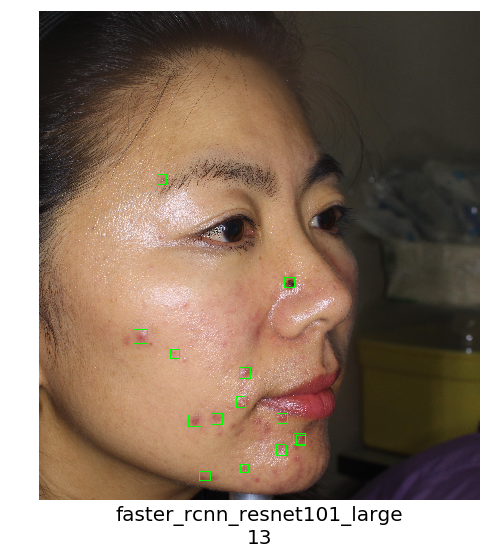

(array([0.90959334, 0.8744665 , 0.8624792 , 0.8535587 , 0.84905154,
        0.834025  , 0.8169139 , 0.76795244, 0.7452274 , 0.73845565,
        0.73165554, 0.7181478 , 0.67827785, 0.61819255], dtype=float32),
 array([[0.7287487 , 0.4553298 , 0.7518605 , 0.47997305],
        [0.6527466 , 0.21467741, 0.6800784 , 0.24486667],
        [0.8265208 , 0.33871162, 0.8496194 , 0.3686967 ],
        [0.5452652 , 0.5561231 , 0.5667084 , 0.58004975],
        [0.941761  , 0.363722  , 0.96015316, 0.38858974],
        [0.9283341 , 0.45656663, 0.94423056, 0.47486466],
        [0.7896953 , 0.44663647, 0.81122917, 0.4689438 ],
        [0.6932921 , 0.29767346, 0.7114555 , 0.3193803 ],
        [0.823123  , 0.3901326 , 0.84503865, 0.41578567],
        [0.82249767, 0.5394723 , 0.8444084 , 0.56302357],
        [0.8641877 , 0.5778974 , 0.88716537, 0.6044233 ],
        [0.8693298 , 0.58383447, 0.8890236 , 0.60389006],
        [0.33540574, 0.26975328, 0.35576123, 0.2899721 ],
        [0.88695514, 0.53902894, 0.90

In [109]:
detect_and_draw(all_fi[1000],show=True,title='faster_rcnn_resnet101_large',savefig=True)

levle0_1.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.065089225769043 second(s)


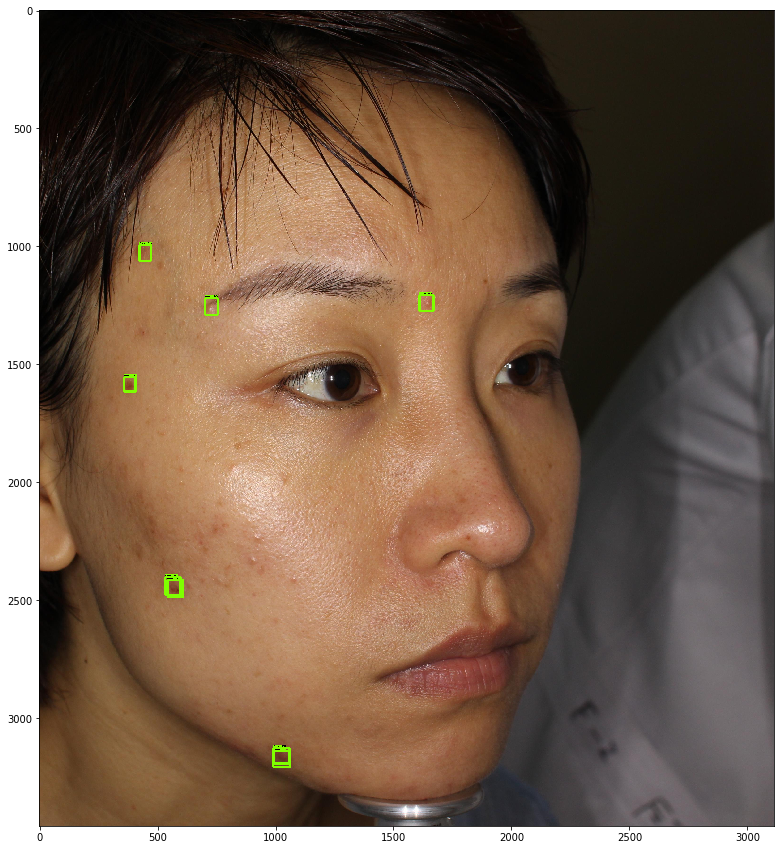

In [26]:
hehe_scores, hehe_boxes = detect_and_draw(all_fi[0], min_score_thresh=0.25, show=True)

In [27]:
hehe_boxes

array([[0.45001075, 0.1154731 , 0.4675534 , 0.1311112 ],
       [0.34935287, 0.51743543, 0.36876658, 0.53664744],
       [0.6988401 , 0.17463875, 0.7187038 , 0.19643845],
       [0.9044685 , 0.31885573, 0.9231153 , 0.34076238],
       [0.35297582, 0.22586365, 0.37337577, 0.24339737],
       [0.9082791 , 0.31855273, 0.92779225, 0.34220466],
       [0.28764042, 0.13624877, 0.3073137 , 0.15284148],
       [0.6952351 , 0.17155938, 0.7165075 , 0.19261315]], dtype=float32)

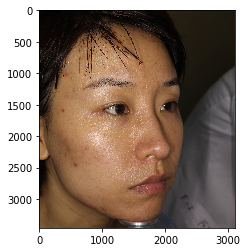

In [28]:
img_test = cv2.imread(all_fi[0])[...,::-1]
plt.imshow(img_test)

In [29]:
fl_w, fl_h = img_test.shape[:2]
fl_w, fl_h

(3456, 3112)

In [30]:
mask_acne = np.zeros(shape=(fl_w, fl_h), dtype=np.uint8)
img_with_boxes = img_test.copy()
for ymin, xmin, ymax, xmax in hehe_boxes:
    ymin, xmin, ymax, xmax = int(round(ymin*fl_w)), int(round(xmin*fl_h)), int(round(ymax*fl_w)), int(round(xmax*fl_h))
    mask_acne[ymin:ymax, xmin:xmax] = 1
    cv2.rectangle(img_with_boxes, (xmin, ymin), (xmax, ymax), (0, 255, 0), 10)

In [31]:
mask_acne.shape

(3456, 3112)

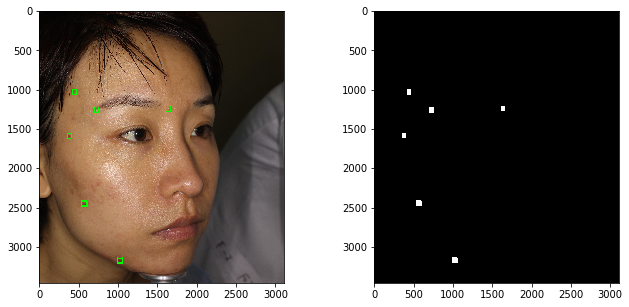

In [32]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(11,5))
ax1.imshow(img_with_boxes)
ax2.imshow(mask_acne,cmap='gray')
plt.show()

In [33]:
_, labels = cv2.connectedComponents(mask_acne, 1, 4)
labels = np.unique(labels)
acne_num = max(0, len(labels) - 1)
acne_num

6

In [34]:
detect(all_fi[0], min_score_thresh=[0.1,0.25,0.5,0.75])

levle0_1.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.0378737449646 second(s)


({0.1: array([0.8805046 , 0.867028  , 0.86400163, 0.8568338 , 0.54155153,
         0.5142835 , 0.33700997, 0.28298354, 0.24575557, 0.22933885,
         0.20716281, 0.20430624, 0.19910811, 0.13690843, 0.12157002,
         0.11514288, 0.10619147], dtype=float32),
  0.25: array([0.8805046 , 0.867028  , 0.86400163, 0.8568338 , 0.54155153,
         0.5142835 , 0.33700997, 0.28298354], dtype=float32),
  0.5: array([0.8805046 , 0.867028  , 0.86400163, 0.8568338 , 0.54155153,
         0.5142835 ], dtype=float32),
  0.75: array([0.8805046 , 0.867028  , 0.86400163, 0.8568338 ], dtype=float32)},
 {0.1: array([[0.45001075, 0.1154731 , 0.4675534 , 0.1311112 ],
         [0.34935287, 0.51743543, 0.36876658, 0.53664744],
         [0.6988401 , 0.17463875, 0.7187038 , 0.19643845],
         [0.9044685 , 0.31885573, 0.9231153 , 0.34076238],
         [0.35297582, 0.22586365, 0.37337577, 0.24339737],
         [0.9082791 , 0.31855273, 0.92779225, 0.34220466],
         [0.28764042, 0.13624877, 0.3073137 , 0.1

In [38]:
df_ann = pd.read_csv('/export/servers/data/acne/annotations_comprehensive.csv')

In [39]:
df_ann['img_ori_name'] = df_ann['img_filename'].apply(lambda fn:fn.replace("level", "levle"))

In [40]:
df_ann = df_ann[['img_ori_name','acne_lesion_num','severity_level']]

In [41]:
df_ann = df_ann[df_ann['img_ori_name'].isin([os.path.basename(item) for item in all_fi])].reset_index(drop=True)

In [42]:
df_ann

,img_ori_name,acne_lesion_num,severity_level
0,levle0_451.jpg,2,0
1,levle0_498.jpg,1,0
2,levle0_485.jpg,3,0
3,levle0_218.jpg,2,0
4,levle1_344.jpg,4,0
5,levle0_302.jpg,2,0
6,levle1_413.jpg,4,0
7,levle0_210.jpg,2,0
8,levle0_83.jpg,1,0
9,levle0_319.jpg,2,0


In [43]:
to_test_images = df_ann['img_ori_name'].values.tolist()

In [44]:
len(to_test_images)

1222

In [45]:
res_75 = {fn:0 for fn in to_test_images}
res_50 = {fn:0 for fn in to_test_images}
res_25 = {fn:0 for fn in to_test_images}
res_10 = {fn:0 for fn in to_test_images}

In [47]:
for fn in to_test_images:
    fp = os.path.join(filtered_image_path, fn)
    _, _, num = detect(fp, min_score_thresh=[0.1,0.25,0.5,0.75])
#     scores,_ = detect_and_draw(fp, min_score_thresh=0.75, show=False)
    res_75[fn] = num[0.75]
    res_50[fn] = num[0.5]
    res_25[fn] = num[0.25]
    res_10[fn] = num[0.1]

levle0_451.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.145033121109009 second(s)
levle0_498.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.056303024291992 second(s)
levle0_485.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.035888671875 second(s)
levle0_218.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.051073789596558 second(s)
levle1_344.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.1196815967559814 second(s)
levle0_302.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.066538333892822 second(s)
levle1_413.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.205455541610718 second(s)
levle0_210.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.153646469116211 second(s)
levle0_83.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.484274625778198 second(s)
levle0_319.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.215642690658569 second(s)
levle0_64.jpg

levle0_354.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.4057297706604 second(s)
levle0_142.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.2332072257995605 second(s)
levle0_16.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.394445180892944 second(s)
levle0_449.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.164209604263306 second(s)
levle0_335.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.1618921756744385 second(s)
levle0_377.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.293193578720093 second(s)
levle0_389.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.463227033615112 second(s)
levle0_240.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.146935224533081 second(s)
levle0_467.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.120018243789673 second(s)
levle0_436.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.378549337387085 second(s)
levle0_144.

levle1_91.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.676140546798706 second(s)
levle1_82.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 5.3780717849731445 second(s)
levle1_576.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.468515872955322 second(s)
levle1_515.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.268531322479248 second(s)
levle1_472.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.48715877532959 second(s)
levle1_615.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.451625108718872 second(s)
levle1_192.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.476921081542969 second(s)
levle2_86.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.153226375579834 second(s)
levle1_385.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.505122423171997 second(s)
levle1_63.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.456737041473389 second(s)
levle1_320.jpg

levle0_385.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.332984209060669 second(s)
levle0_267.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.486037731170654 second(s)
levle0_216.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.425689220428467 second(s)
levle0_89.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.7055580615997314 second(s)
levle0_190.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.649300813674927 second(s)
levle0_172.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.248772144317627 second(s)
levle0_160.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.450802326202393 second(s)
levle0_516.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.714154481887817 second(s)
levle0_45.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.646286725997925 second(s)
levle0_81.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.89801812171936 second(s)
levle0_306.jp

levle0_316.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.193409204483032 second(s)
levle0_399.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.490372896194458 second(s)
levle0_330.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.195586919784546 second(s)
levle1_559.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.16457986831665 second(s)
levle0_157.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.338175058364868 second(s)
levle1_157.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.297107934951782 second(s)
levle1_319.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.178238153457642 second(s)
levle1_612.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.238097667694092 second(s)
levle1_297.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.487224340438843 second(s)
levle1_627.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.336944341659546 second(s)
levle1_212.

levle1_274.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.171738862991333 second(s)
levle1_231.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.448044300079346 second(s)
levle1_599.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.594423532485962 second(s)
levle1_185.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.171171426773071 second(s)
levle1_287.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.194295883178711 second(s)
levle1_384.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.115328788757324 second(s)
levle1_364.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.403221607208252 second(s)
levle1_250.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.359184980392456 second(s)
levle1_251.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.474509000778198 second(s)
levle1_372.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.15327000617981 second(s)
levle1_218.

levle0_188.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.339515447616577 second(s)
levle0_120.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.169166326522827 second(s)
levle0_40.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.145509719848633 second(s)
levle0_320.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.23624587059021 second(s)
levle0_261.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.464990615844727 second(s)
levle0_1.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.17665958404541 second(s)
levle0_315.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.182757139205933 second(s)
levle0_137.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.238464117050171 second(s)
levle1_368.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.327851295471191 second(s)
levle1_198.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.356768369674683 second(s)
levle0_291.jpg


levle0_321.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.720229625701904 second(s)
levle0_386.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.438051223754883 second(s)
levle0_171.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.484237194061279 second(s)
levle0_290.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.462038278579712 second(s)
levle0_327.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.502842664718628 second(s)
levle0_419.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.479459524154663 second(s)
levle0_243.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.482052803039551 second(s)
levle1_485.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.434021234512329 second(s)
levle1_462.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.590338230133057 second(s)
levle1_458.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.642468452453613 second(s)
levle1_170

levle1_227.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.164572477340698 second(s)
levle1_357.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.159669637680054 second(s)
levle1_213.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.305472135543823 second(s)
levle1_222.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.41858983039856 second(s)
levle1_64.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.1635682582855225 second(s)
levle1_306.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.163656234741211 second(s)
levle1_80.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.334424257278442 second(s)
levle1_441.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.163811445236206 second(s)
levle1_598.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.409931421279907 second(s)
levle1_301.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.194964408874512 second(s)
levle1_487.j

levle0_149.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.10525107383728 second(s)
levle1_343.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.123019456863403 second(s)
levle0_513.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.095332860946655 second(s)
levle0_94.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.091782569885254 second(s)
levle0_181.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.086470127105713 second(s)
levle0_165.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.091129302978516 second(s)
levle0_77.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.279710531234741 second(s)
levle0_400.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.090874195098877 second(s)
levle0_98.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.114777565002441 second(s)
levle0_373.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.081723213195801 second(s)
levle0_231.jpg

levle1_84.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.2477076053619385 second(s)
levle1_577.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.0735924243927 second(s)
levle1_632.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.058645725250244 second(s)
levle1_282.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.038379907608032 second(s)
levle1_425.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.059422969818115 second(s)
levle1_446.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.104225397109985 second(s)
levle1_104.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.234483480453491 second(s)
levle1_476.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.040950298309326 second(s)
levle1_395.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.086409330368042 second(s)
levle1_330.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.064454793930054 second(s)
levle1_440.j

levle1_120.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.294942140579224 second(s)
levle1_149.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.08244776725769 second(s)
levle1_317.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.126132249832153 second(s)
levle1_450.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.120591163635254 second(s)
levle1_333.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.118544340133667 second(s)
levle1_85.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.253599405288696 second(s)
levle1_105.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.266184091567993 second(s)
levle1_340.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.153390169143677 second(s)
levle1_281.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.1111085414886475 second(s)
levle1_422.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.148396730422974 second(s)
levle1_241.

levle0_492.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.079504013061523 second(s)
levle0_121.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.071055889129639 second(s)
levle0_264.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.055553674697876 second(s)
levle0_339.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.099838018417358 second(s)
levle0_44.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.0693206787109375 second(s)
levle0_21.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.0672807693481445 second(s)
levle0_334.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.080170154571533 second(s)
levle0_470.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.083414793014526 second(s)
levle0_482.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.065266370773315 second(s)
levle0_42.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.083878517150879 second(s)
levle0_280.

levle1_305.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.936388731002808 second(s)
levle1_568.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.88433575630188 second(s)
levle1_495.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.848604679107666 second(s)
levle1_318.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.993748903274536 second(s)
levle1_252.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.385078191757202 second(s)
levle1_196.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.267984867095947 second(s)
levle1_592.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.205142259597778 second(s)
levle2_68.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 5.458163738250732 second(s)
levle1_362.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.223135471343994 second(s)
levle1_136.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.253693103790283 second(s)
levle1_44.jp

levle1_267.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 5.904723167419434 second(s)
levle1_508.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.098310708999634 second(s)
levle1_603.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.121421575546265 second(s)
levle1_177.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.05689811706543 second(s)
levle1_439.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.091409206390381 second(s)
levle1_225.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.087803840637207 second(s)
levle1_199.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.077517986297607 second(s)
levle1_89.jpg
48098304 (3264, 4912, 3) (3264, 4912, 3)
detection cost 4.265223741531372 second(s)
levle1_581.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.07491660118103 second(s)
levle1_45.jpg
32265216 (3456, 3112, 3) (3456, 3112, 3)
detection cost 4.075891017913818 second(s)
levle1_275.jpg

In [48]:
df_ann['res10_num'] = df_ann['img_ori_name'].apply(lambda n:res_10[n])
df_ann['res25_num'] = df_ann['img_ori_name'].apply(lambda n:res_25[n])
df_ann['res50_num'] = df_ann['img_ori_name'].apply(lambda n:res_50[n])
df_ann['res75_num'] = df_ann['img_ori_name'].apply(lambda n:res_75[n])

In [49]:
df_ann.head()

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num
0,levle0_451.jpg,2,0,3,3,2,1
1,levle0_498.jpg,1,0,3,2,1,0
2,levle0_485.jpg,3,0,5,5,4,4
3,levle0_218.jpg,2,0,6,4,2,1
4,levle1_344.jpg,4,0,2,2,1,1


In [54]:
df_ann["bias10"] = df_ann.apply(lambda row: row["res10_num"]-row["acne_lesion_num"], axis=1)
df_ann["bias25"] = df_ann.apply(lambda row: row["res25_num"]-row["acne_lesion_num"], axis=1)
df_ann["bias50"] = df_ann.apply(lambda row: row["res50_num"]-row["acne_lesion_num"], axis=1)
df_ann["bias75"] = df_ann.apply(lambda row: row["res75_num"]-row["acne_lesion_num"], axis=1)

df_ann.head()

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75
0,levle0_451.jpg,2,0,3,3,2,1,1,1,0,-1
1,levle0_498.jpg,1,0,3,2,1,0,2,1,0,-1
2,levle0_485.jpg,3,0,5,5,4,4,2,2,1,1
3,levle0_218.jpg,2,0,6,4,2,1,4,2,0,-1
4,levle1_344.jpg,4,0,2,2,1,1,-2,-2,-3,-3


In [110]:
df_ann.describe()

,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
count,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000
mean,9.083470,0.762684,10.413257,8.312602,6.030278,3.274959,1.329787,-0.770867,-3.053191,-5.808511,0.795417,0.638298,0.446809,0.169394
std,10.545308,0.738093,8.475349,6.944178,4.874836,2.548403,6.483653,6.923464,8.033791,9.536910,0.619671,0.594906,0.533898,0.375254
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-53.000000,-59.000000,-63.000000,-65.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,5.000000,4.000000,3.000000,1.000000,0.000000,-2.000000,-4.000000,-6.000000,0.000000,0.000000,0.000000,0.000000
50%,6.000000,1.000000,8.000000,6.000000,5.000000,3.000000,2.000000,0.000000,-1.000000,-3.000000,1.000000,1.000000,0.000000,0.000000
75%,10.000000,1.000000,13.000000,11.000000,8.000000,4.000000,4.000000,2.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,0.000000
max,65.000000,3.000000,60.000000,48.000000,36.000000,16.000000,25.000000,19.000000,8.000000,5.000000,3.000000,2.000000,2.000000,1.000000


In [55]:
mae_10 = np.mean(np.abs(df_ann['bias10'].values))
mae_25 = np.mean(np.abs(df_ann['bias25'].values))
mae_50 = np.mean(np.abs(df_ann['bias50'].values))
mae_75 = np.mean(np.abs(df_ann['bias75'].values))

In [56]:
mae_10, mae_25,mae_50,mae_75

(4.102291325695581, 3.7037643207855973, 4.29050736497545, 6.0785597381342065)

In [68]:
rmse_10 = np.sqrt(np.mean((df_ann['bias10'].values)**2))
rmse_25 = np.sqrt(np.mean((df_ann['bias25'].values)**2))
rmse_50 = np.sqrt(np.mean((df_ann['bias50'].values)**2))
rmse_75 = np.sqrt(np.mean((df_ann['bias75'].values)**2))

In [69]:
rmse_10,rmse_25,rmse_50,rmse_75

(6.616017364022518, 6.963430311428962, 8.591330841616715, 11.163199419368793)

In [70]:
df_ann['res10_lv'] = df_ann['res10_num'].apply(lambda n: to_severity(n))
df_ann['res25_lv'] = df_ann['res25_num'].apply(lambda n: to_severity(n))
df_ann['res50_lv'] = df_ann['res50_num'].apply(lambda n: to_severity(n))
df_ann['res75_lv'] = df_ann['res75_num'].apply(lambda n: to_severity(n))

In [71]:
df_ann.head()

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
0,levle0_451.jpg,2,0,3,3,2,1,1,1,0,-1,0,0,0,0
1,levle0_498.jpg,1,0,3,2,1,0,2,1,0,-1,0,0,0,0
2,levle0_485.jpg,3,0,5,5,4,4,2,2,1,1,0,0,0,0
3,levle0_218.jpg,2,0,6,4,2,1,4,2,0,-1,1,0,0,0
4,levle1_344.jpg,4,0,2,2,1,1,-2,-2,-3,-3,0,0,0,0


In [72]:
df_ann.describe()

,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
count,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000,1222.000000
mean,9.083470,0.762684,10.413257,8.312602,6.030278,3.274959,1.329787,-0.770867,-3.053191,-5.808511,0.795417,0.638298,0.446809,0.169394
std,10.545308,0.738093,8.475349,6.944178,4.874836,2.548403,6.483653,6.923464,8.033791,9.536910,0.619671,0.594906,0.533898,0.375254
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-53.000000,-59.000000,-63.000000,-65.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,5.000000,4.000000,3.000000,1.000000,0.000000,-2.000000,-4.000000,-6.000000,0.000000,0.000000,0.000000,0.000000
50%,6.000000,1.000000,8.000000,6.000000,5.000000,3.000000,2.000000,0.000000,-1.000000,-3.000000,1.000000,1.000000,0.000000,0.000000
75%,10.000000,1.000000,13.000000,11.000000,8.000000,4.000000,4.000000,2.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,0.000000
max,65.000000,3.000000,60.000000,48.000000,36.000000,16.000000,25.000000,19.000000,8.000000,5.000000,3.000000,2.000000,2.000000,1.000000


In [115]:
stats_by_lv = {}
for lv, df_lv in df_ann.groupby("severity_level"):
    lv_mae_10 = np.mean(np.abs(df_lv['bias10'].values))
    lv_mae_25 = np.mean(np.abs(df_lv['bias25'].values))
    lv_mae_50 = np.mean(np.abs(df_lv['bias50'].values))
    lv_mae_75 = np.mean(np.abs(df_lv['bias75'].values))
    lv_rmse_10 = np.sqrt(np.mean(np.abs(df_lv['bias10'].values)**2))
    lv_rmse_25 = np.sqrt(np.mean(np.abs(df_lv['bias25'].values)**2))
    lv_rmse_50 = np.sqrt(np.mean(np.abs(df_lv['bias50'].values)**2))
    lv_rmse_75 = np.sqrt(np.mean(np.abs(df_lv['bias75'].values)**2))
    lv_mean_10 = np.mean(df_lv['bias10'].values)
    lv_mean_25 = np.mean(df_lv['bias25'].values)
    lv_mean_50 = np.mean(df_lv['bias50'].values)
    lv_mean_75 = np.mean(df_lv['bias75'].values)
    lv_std_10 = np.std(df_lv['bias10'].values)
    lv_std_25 = np.std(df_lv['bias25'].values)
    lv_std_50 = np.std(df_lv['bias50'].values)
    lv_std_75 = np.std(df_lv['bias75'].values)
    stats_by_lv["level{}".format(lv)] = {"mae10":lv_mae_10, "mae25":lv_mae_25, "mae50":lv_mae_50, "mae75":lv_mae_75, "rmse10":lv_rmse_10, "rmse25":lv_rmse_25, "rmse50":lv_rmse_50, "rmse75":lv_rmse_75, "mean10":lv_mean_10, "mean25":lv_mean_25, "mean50":lv_mean_50, "mean75":lv_mean_75, "std10":lv_std_10, "std25":lv_std_25, "std50":lv_std_50, "std75":lv_std_75}

In [116]:
stats_by_lv

{'level0': {'mae10': 2.8029045643153525,
  'mae25': 1.887966804979253,
  'mae50': 1.2489626556016598,
  'mae75': 0.975103734439834,
  'rmse10': 3.6572556202977076,
  'rmse25': 2.5742097848849674,
  'rmse50': 1.8001844073357978,
  'rmse75': 1.3542617532314645,
  'mean10': 2.6535269709543567,
  'mean25': 1.6182572614107884,
  'mean50': 0.7219917012448133,
  'mean75': -0.3651452282157676,
  'std10': 2.516806167867714,
  'std25': 2.001948913556179,
  'std50': 1.6490578776224192,
  'std75': 1.3041065365133384},
 'level1': {'mae10': 3.5951557093425603,
  'mae25': 2.801038062283737,
  'mae50': 3.1193771626297577,
  'mae75': 5.079584775086505,
  'rmse10': 4.899685746578541,
  'rmse25': 3.6808209555171785,
  'rmse50': 3.891477690533116,
  'rmse75': 5.787768991260257,
  'mean10': 2.2110726643598615,
  'mean25': 0.00865051903114187,
  'mean50': -2.2197231833910034,
  'mean75': -5.017301038062284,
  'std10': 4.37242245078692,
  'std25': 3.6808107904502356,
  'std50': 3.1963146911769287,
  'std75':

In [144]:
np.unique(df_ann['severity_level'].values, return_counts=True)

(array([0, 1, 2, 3]), array([482, 578, 132,  30]))

In [131]:
df_ann[df_ann['severity_level']==3]

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
237,levle3_80.jpg,57,3,53,45,23,9,-4,-12,-34,-48,3,2,2,1
238,levle3_36.jpg,52,3,35,35,24,10,-17,-17,-28,-42,2,2,2,1
239,levle3_144.jpg,58,3,25,16,10,4,-33,-42,-48,-54,2,1,1,0
240,levle3_97.jpg,64,3,22,20,15,4,-42,-44,-49,-60,2,1,1,0
481,levle3_94.jpg,53,3,59,48,26,6,6,-5,-27,-47,3,2,2,1
482,levle3_92.jpg,56,3,51,38,25,10,-5,-18,-31,-46,3,2,2,1
483,levle3_143.jpg,53,3,12,7,4,2,-41,-46,-49,-51,1,1,0,0
484,levle3_130.jpg,53,3,43,36,27,10,-10,-17,-26,-43,2,2,2,1
485,levle3_131.jpg,51,3,42,23,18,7,-9,-28,-33,-44,2,2,1,1
486,levle3_79.jpg,64,3,26,26,17,10,-38,-38,-47,-54,2,2,1,1


In [203]:
df_positive_examples = df_ann[df_ann["bias50"]==0]

df_positive_examples

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
0,levle0_451.jpg,2,0,3,3,2,1,1,1,0,-1,0,0,0,0
1,levle0_498.jpg,1,0,3,2,1,0,2,1,0,-1,0,0,0,0
3,levle0_218.jpg,2,0,6,4,2,1,4,2,0,-1,1,0,0,0
11,levle0_103.jpg,2,0,4,3,2,1,2,1,0,-1,0,0,0,0
12,levle0_213.jpg,2,0,4,2,2,2,2,0,0,0,0,0,0,0
16,levle0_202.jpg,2,0,5,3,2,1,3,1,0,-1,0,0,0,0
20,levle0_289.jpg,2,0,3,3,2,0,1,1,0,-2,0,0,0,0
21,levle0_346.jpg,3,0,4,3,3,2,1,0,0,-1,0,0,0,0
26,levle0_307.jpg,1,0,1,1,1,0,0,0,0,-1,0,0,0,0
27,levle0_510.jpg,2,0,7,6,2,1,5,4,0,-1,1,1,0,0


In [218]:
positive_examples = ["levle0_346.jpg", "levle0_488.jpg", "levle1_624.jpg", "levle1_540.jpg"]

levle1_540.jpg
(3456, 3112, 3)
detection cost 4.116917133331299 second(s)


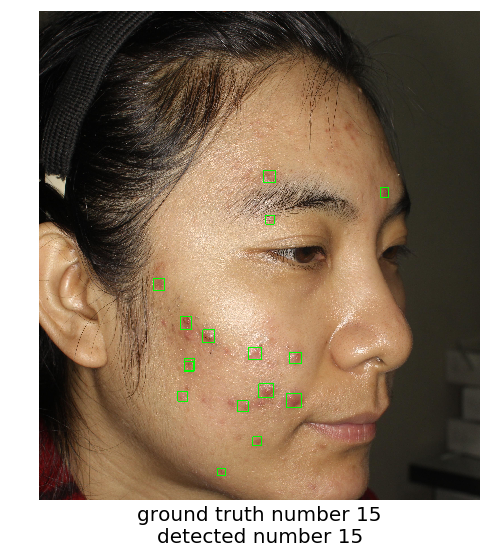

(array([0.90727115, 0.89841163, 0.8981282 , 0.89229774, 0.88218033,
        0.85231847, 0.850353  , 0.8496148 , 0.84713817, 0.84603584,
        0.83503675, 0.75545275, 0.7128171 , 0.6431249 , 0.63387805,
        0.6013229 ], dtype=float32),
 array([[0.5468358 , 0.26018265, 0.57251346, 0.28513458],
        [0.6529056 , 0.37077397, 0.6789501 , 0.3979496 ],
        [0.698228  , 0.567795  , 0.72224414, 0.5946308 ],
        [0.87112355, 0.4850497 , 0.8892433 , 0.5053883 ],
        [0.78286535, 0.56122535, 0.8110678 , 0.5953286 ],
        [0.7782052 , 0.31435564, 0.797889  , 0.33658075],
        [0.32688   , 0.5091657 , 0.35155043, 0.5356275 ],
        [0.7624625 , 0.4984982 , 0.7909633 , 0.5314226 ],
        [0.6880594 , 0.47452506, 0.7136468 , 0.50471884],
        [0.6255791 , 0.31959012, 0.65165323, 0.34539255],
        [0.41912624, 0.5144982 , 0.43663836, 0.5331603 ],
        [0.9354381 , 0.4046915 , 0.9503501 , 0.42319602],
        [0.71164155, 0.3304587 , 0.7347559 , 0.35259995],
     

In [221]:
detect_and_draw(os.path.join(filtered_image_path, positive_examples[3]), show=True, min_score_thresh=0.5, title='ground truth number 15',savefig=True)

In [222]:
monitoring_examples = ["levle1_361.jpg", "levle1_364.jpg", "levle1_362.jpg", "levle1_363.jpg"]

In [223]:
df_ann[df_ann['img_ori_name'].isin(monitoring_examples)]

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
97,levle1_363.jpg,6,1,4,4,4,2,-2,-2,-2,-4,0,0,0,0
421,levle1_364.jpg,14,1,14,11,9,3,0,-3,-5,-11,1,1,1,0
626,levle1_361.jpg,10,1,16,14,10,5,6,4,0,-5,1,1,1,0
1098,levle1_362.jpg,7,1,10,10,9,4,3,3,2,-3,1,1,1,0


levle1_363.jpg
(3456, 3112, 3)
detection cost 4.079424142837524 second(s)


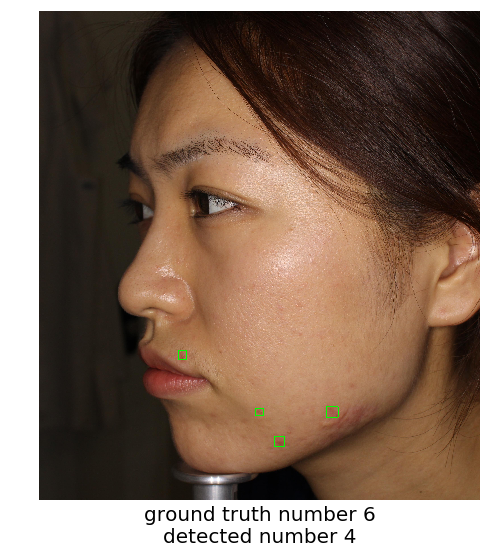

In [230]:
_,_,_ = detect_and_draw(os.path.join(filtered_image_path, monitoring_examples[3]), show=True, min_score_thresh=0.5, title='ground truth number 6',savefig=True)

In [78]:
testset_images = glob.glob("/export/servers/data/acne04/test_set_images/*.jpg")

In [117]:
testset_images

['/export/servers/data/acne04/test_set_images/levle3_142.jpg',
 '/export/servers/data/acne04/test_set_images/levle3_130.jpg',
 '/export/servers/data/acne04/test_set_images/levle3_132.jpg',
 '/export/servers/data/acne04/test_set_images/levle2_169.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_553.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_513.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_367.jpg',
 '/export/servers/data/acne04/test_set_images/levle2_181.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_548.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_368.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_365.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_363.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_361.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_362.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_364.jpg',
 '/export/servers/data/acne04/test_set_images/levle1_36

In [119]:
df_ann[df_ann['img_ori_name'].isin(["levle3_142.jpg","levle3_130.jpg","levle3_132.jpg"])]

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
484,levle3_130.jpg,53,3,43,36,27,10,-10,-17,-26,-43,2,2,2,1
972,levle3_142.jpg,55,3,16,9,4,1,-39,-46,-51,-54,1,1,0,0
1210,levle3_132.jpg,62,3,39,32,24,10,-23,-30,-38,-52,2,2,2,1


levle3_132.jpg
(3456, 3112, 3)
detection cost 4.152146816253662 second(s)


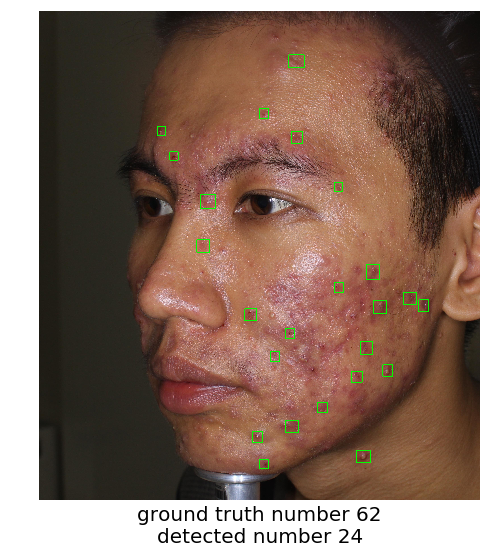

(array([0.91737866, 0.8769264 , 0.8669427 , 0.85748553, 0.8105091 ,
        0.8097967 , 0.79821056, 0.7750837 , 0.7693736 , 0.76357716,
        0.7390036 , 0.73353726, 0.7260458 , 0.7000941 , 0.68019646,
        0.6669484 , 0.62555796, 0.617979  , 0.61554444, 0.613089  ,
        0.60902196, 0.57958883, 0.52581453, 0.5208614 ], dtype=float32),
 array([[0.60926354, 0.4669572 , 0.6334817 , 0.49369782],
        [0.8602671 , 0.48412287, 0.88286895, 0.5067772 ],
        [0.23737712, 0.26878366, 0.2564412 , 0.28644106],
        [0.24737428, 0.5722705 , 0.2715995 , 0.59768414],
        [0.89776057, 0.7199894 , 0.92421204, 0.75197035],
        [0.9168636 , 0.49938983, 0.9349863 , 0.5208928 ],
        [0.20116794, 0.49912965, 0.22235575, 0.52119285],
        [0.46833083, 0.35790318, 0.4944701 , 0.38620082],
        [0.519618  , 0.7417283 , 0.54949206, 0.7728053 ],
        [0.3758335 , 0.3658724 , 0.40521756, 0.3991905 ],
        [0.8016691 , 0.6303962 , 0.82183087, 0.65450174],
        [0.724345

In [133]:
detect_and_draw(testset_images[2],show=True,title='ground truth number 62',savefig=True)

levle3_142.jpg
(1080, 1920, 3)
detection cost 4.13840389251709 second(s)


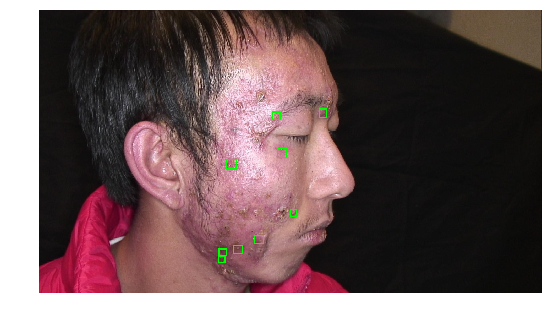

9 acne lesions detected in levle3_142.jpg
levle3_130.jpg
(3456, 3112, 3)
detection cost 4.126821994781494 second(s)


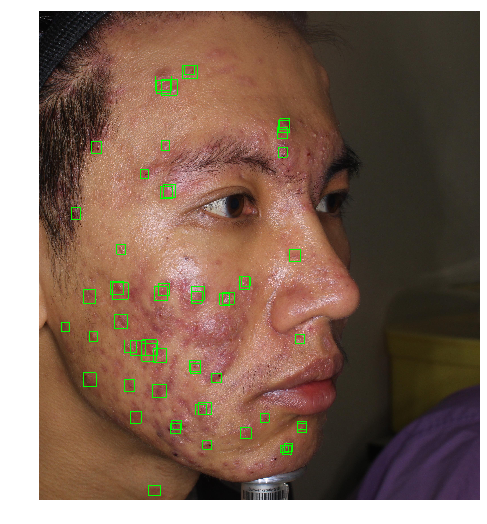

36 acne lesions detected in levle3_130.jpg
levle3_132.jpg
(3456, 3112, 3)
detection cost 4.0684449672698975 second(s)


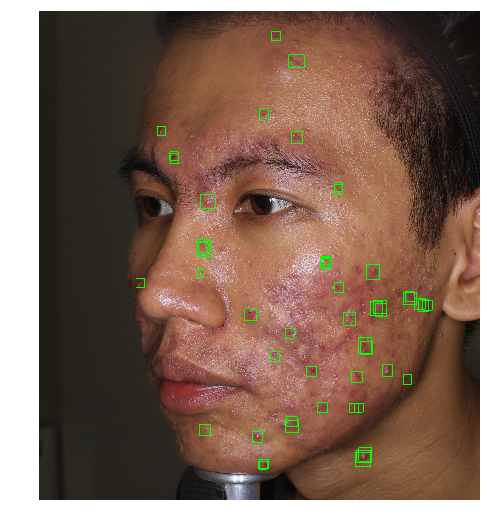

32 acne lesions detected in levle3_132.jpg
levle2_169.jpg
(3456, 3112, 3)
detection cost 4.104147672653198 second(s)


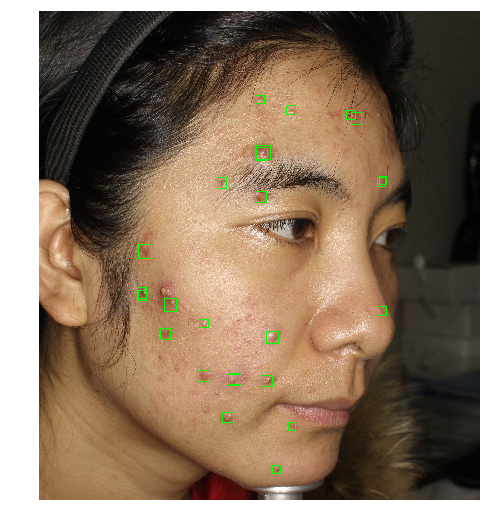

20 acne lesions detected in levle2_169.jpg
levle1_553.jpg
(3456, 3112, 3)
detection cost 4.034712791442871 second(s)


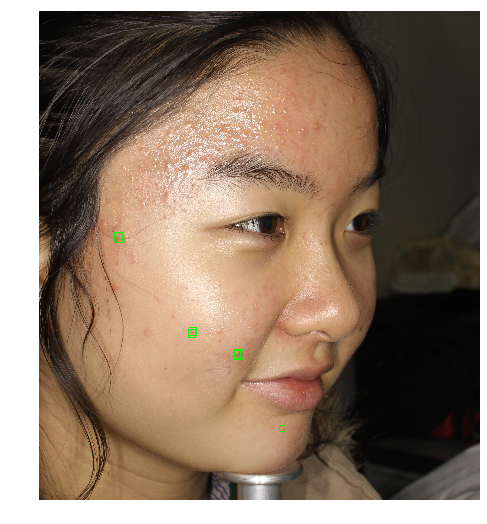

4 acne lesions detected in levle1_553.jpg
levle1_513.jpg
(3456, 3112, 3)
detection cost 4.066968679428101 second(s)


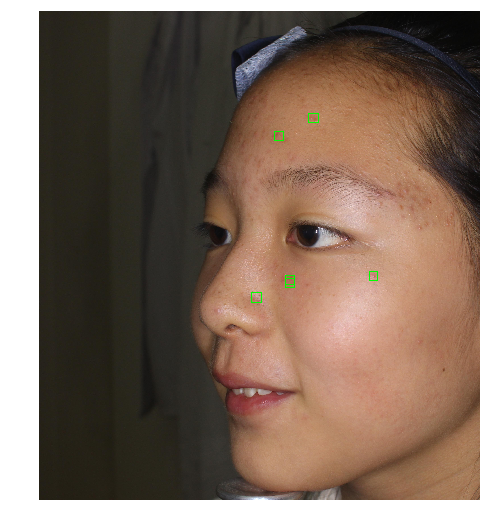

5 acne lesions detected in levle1_513.jpg
levle1_367.jpg
(3456, 3112, 3)
detection cost 4.018182039260864 second(s)


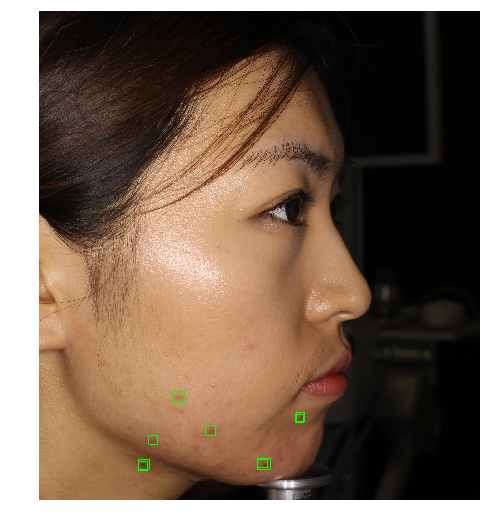

6 acne lesions detected in levle1_367.jpg
levle2_181.jpg
(3456, 3112, 3)
detection cost 4.0869200229644775 second(s)


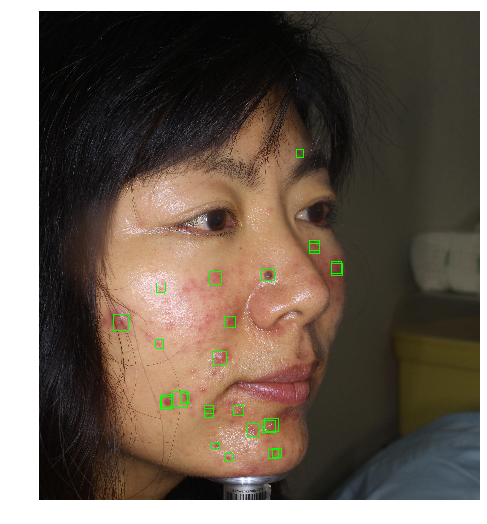

18 acne lesions detected in levle2_181.jpg
levle1_548.jpg
(3456, 3112, 3)
detection cost 4.074148654937744 second(s)


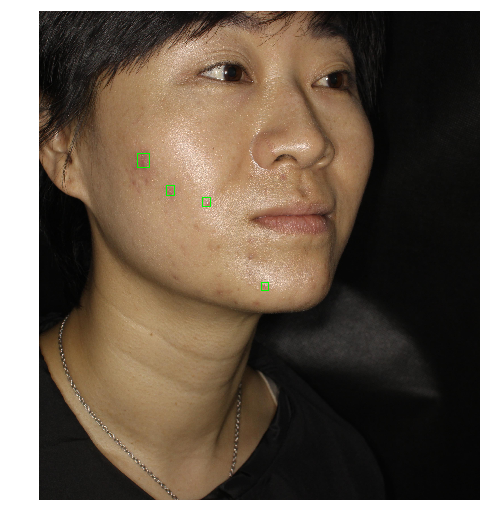

4 acne lesions detected in levle1_548.jpg
levle1_368.jpg
(3456, 3112, 3)
detection cost 4.06461501121521 second(s)


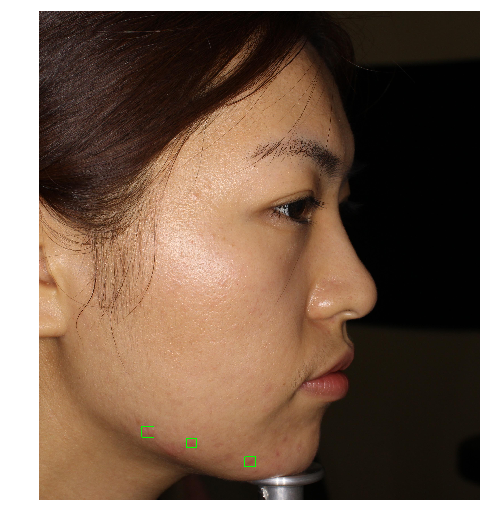

3 acne lesions detected in levle1_368.jpg
levle1_365.jpg
(3456, 3112, 3)
detection cost 4.011821031570435 second(s)


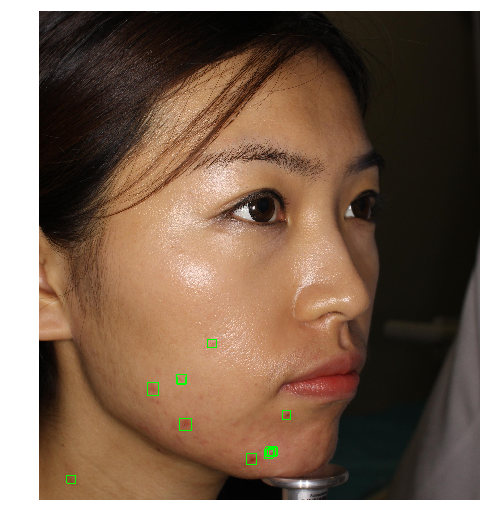

8 acne lesions detected in levle1_365.jpg
levle1_363.jpg
(3456, 3112, 3)
detection cost 4.0235819816589355 second(s)


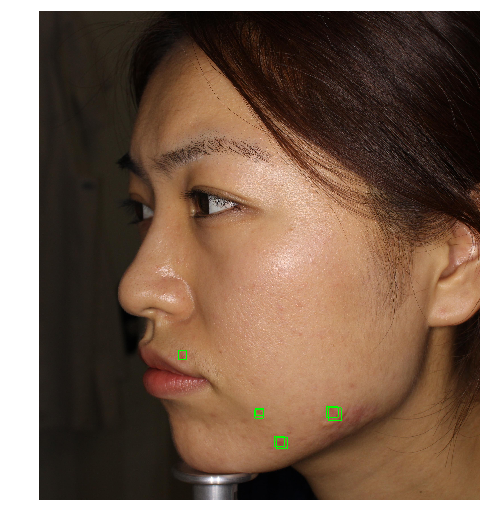

4 acne lesions detected in levle1_363.jpg
levle1_361.jpg
(3456, 3112, 3)
detection cost 4.035872459411621 second(s)


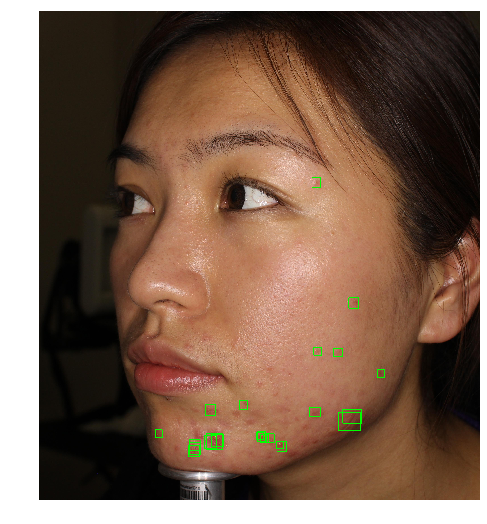

14 acne lesions detected in levle1_361.jpg
levle1_362.jpg
(3456, 3112, 3)
detection cost 4.045314311981201 second(s)


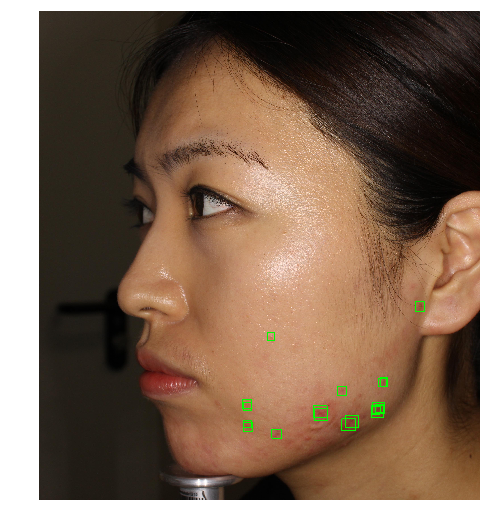

10 acne lesions detected in levle1_362.jpg
levle1_364.jpg
(3456, 3112, 3)
detection cost 4.078258514404297 second(s)


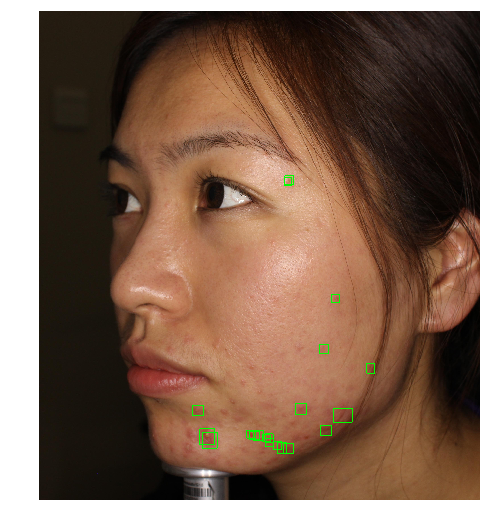

11 acne lesions detected in levle1_364.jpg
levle1_366.jpg
(3456, 3112, 3)
detection cost 4.1393067836761475 second(s)


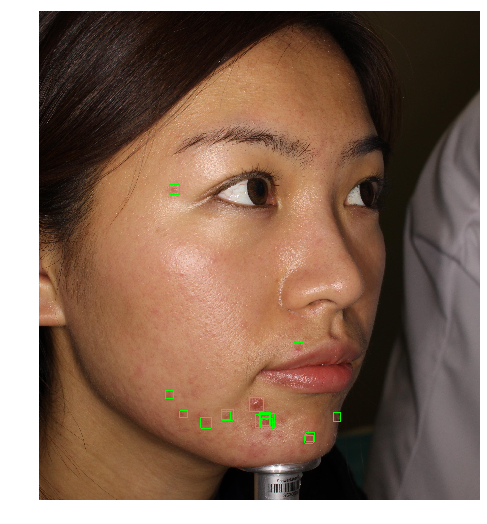

10 acne lesions detected in levle1_366.jpg
levle1_369.jpg
(3456, 3112, 3)
detection cost 4.063974618911743 second(s)


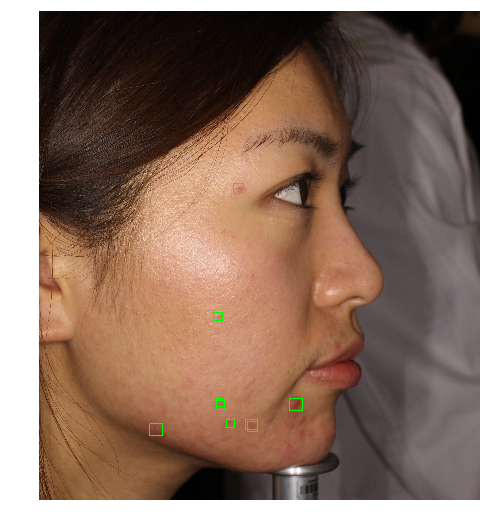

7 acne lesions detected in levle1_369.jpg
levle2_72.jpg
(3456, 3112, 3)
detection cost 4.110700368881226 second(s)


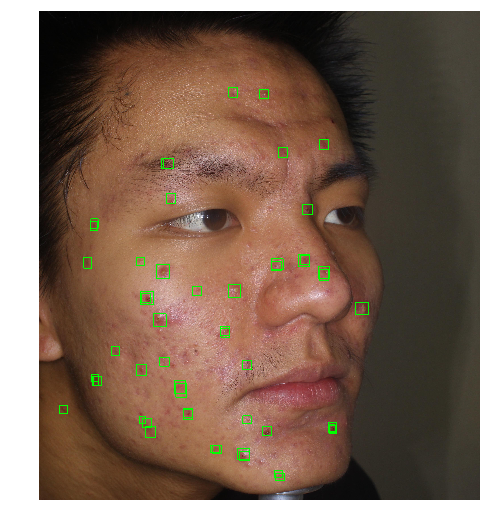

35 acne lesions detected in levle2_72.jpg
levle1_359.jpg
(3456, 3112, 3)
detection cost 4.086046934127808 second(s)


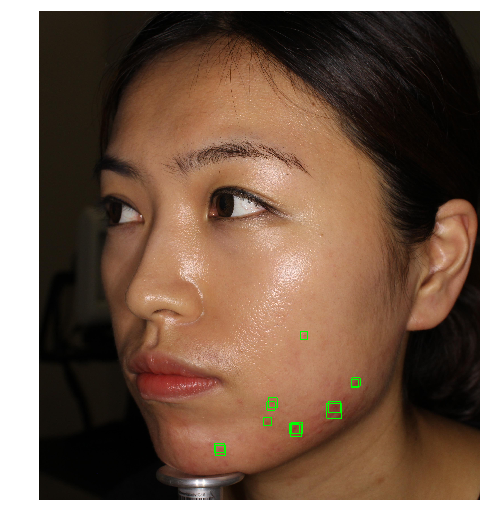

7 acne lesions detected in levle1_359.jpg
levle1_360.jpg
(3456, 3112, 3)
detection cost 4.088834047317505 second(s)


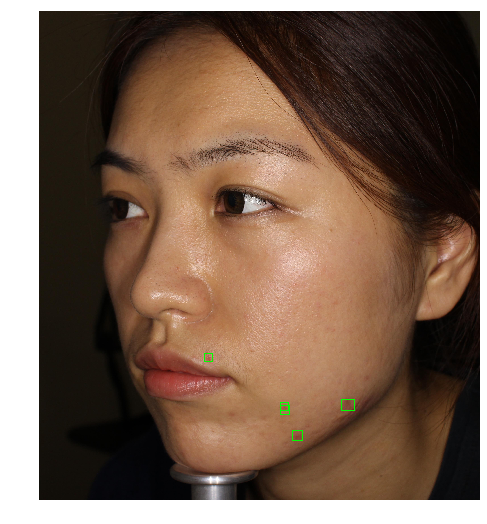

4 acne lesions detected in levle1_360.jpg
levle0_41.jpg
(3456, 3112, 3)
detection cost 4.050585508346558 second(s)


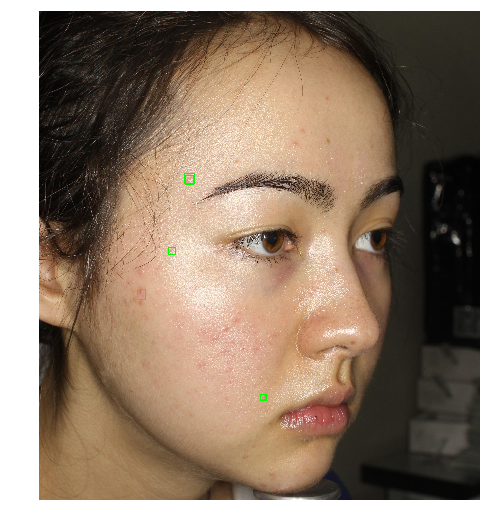

4 acne lesions detected in levle0_41.jpg
levle0_221.jpg
(3456, 3112, 3)
detection cost 4.053482532501221 second(s)


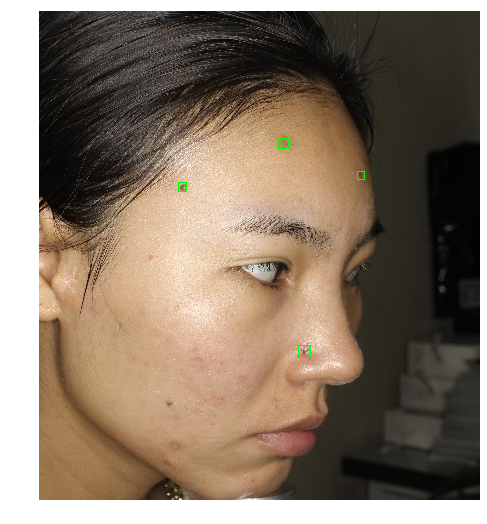

4 acne lesions detected in levle0_221.jpg


In [108]:
for img in testset_images:
    _,_,num = detect_and_draw(img, min_score_thresh=0.25, show=True)
    print(f"{num} acne lesions detected in {os.path.basename(img)}")

In [134]:
df_ann.head()

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
0,levle0_451.jpg,2,0,3,3,2,1,1,1,0,-1,0,0,0,0
1,levle0_498.jpg,1,0,3,2,1,0,2,1,0,-1,0,0,0,0
2,levle0_485.jpg,3,0,5,5,4,4,2,2,1,1,0,0,0,0
3,levle0_218.jpg,2,0,6,4,2,1,4,2,0,-1,1,0,0,0
4,levle1_344.jpg,4,0,2,2,1,1,-2,-2,-3,-3,0,0,0,0


In [136]:
df_ann[["acne_lesion_num","res10_num","res25_num","res50_num","res75_num"]].corr()

,acne_lesion_num,res10_num,res25_num,res50_num,res75_num
acne_lesion_num,1.000000,0.788795,0.761253,0.684987,0.497610
res10_num,0.788795,1.000000,0.971222,0.918210,0.733855
res25_num,0.761253,0.971222,1.000000,0.954261,0.775794
res50_num,0.684987,0.918210,0.954261,1.000000,0.864013
res75_num,0.497610,0.733855,0.775794,0.864013,1.000000


In [187]:
polyn = np.poly1d(np.polyfit(df_ann['acne_lesion_num'],df_ann["res25_num"], 1))

In [260]:
df_low_severity = df_ann[df_ann["severity_level"].isin([0,1,2])]

df_low_severity

,img_ori_name,acne_lesion_num,severity_level,res10_num,res25_num,res50_num,res75_num,bias10,bias25,bias50,bias75,res10_lv,res25_lv,res50_lv,res75_lv
0,levle0_451.jpg,2,0,3,3,2,1,1,1,0,-1,0,0,0,0
1,levle0_498.jpg,1,0,3,2,1,0,2,1,0,-1,0,0,0,0
2,levle0_485.jpg,3,0,5,5,4,4,2,2,1,1,0,0,0,0
3,levle0_218.jpg,2,0,6,4,2,1,4,2,0,-1,1,0,0,0
4,levle1_344.jpg,4,0,2,2,1,1,-2,-2,-3,-3,0,0,0,0
5,levle0_302.jpg,2,0,3,1,1,1,1,-1,-1,-1,0,0,0,0
6,levle1_413.jpg,4,0,4,2,0,0,0,-2,-4,-4,0,0,0,0
7,levle0_210.jpg,2,0,5,4,4,2,3,2,2,0,0,0,0,0
8,levle0_83.jpg,1,0,10,6,4,2,9,5,3,1,1,1,0,0
9,levle0_319.jpg,2,0,5,5,5,3,3,3,3,1,0,0,0,0


In [261]:
polyn_ls = np.poly1d(np.polyfit(df_low_severity['acne_lesion_num'],df_low_severity["res25_num"], 1))

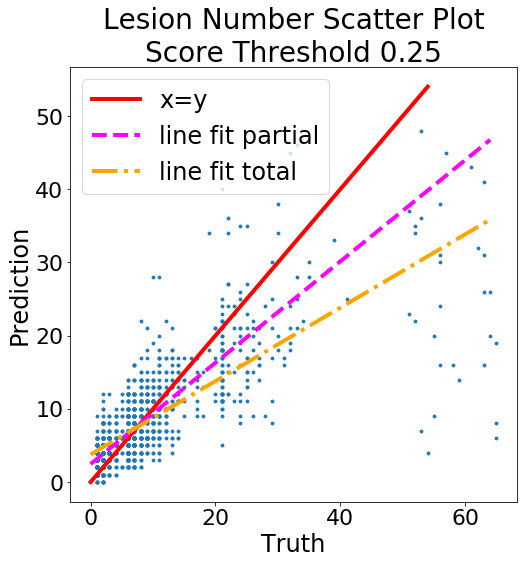

In [270]:
fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(df_ann['acne_lesion_num'].values,df_ann["res25_num"].values, s=8)
# ax.set_xlim(0,65)
# ax.set_ylim(0,65)
ax.plot(np.arange(0,55,1),np.arange(0,55,1), color='red', linewidth=4, linestyle='solid', label="x=y")
ax.plot(np.arange(0,65,1),polyn_ls(np.arange(0,65,1)), color='magenta', linewidth=4, linestyle='dashed', label="line fit partial")
ax.plot(np.arange(0,65,1),polyn(np.arange(0,65,1)), color='orange', linewidth=4, linestyle='dashdot', label="line fit total")
ax.legend(loc="best",fontsize=24)
ax.set_xlabel("Truth",fontsize=24)
ax.set_ylabel("Prediction",fontsize=24)
ax.tick_params(axis = 'both', which = 'major', labelsize = 22)
plt.title("Lesion Number Scatter Plot\nScore Threshold 0.25",fontsize=28)
plt.savefig("scatter_plot_25.pdf", bbox_inches='tight', transparent=True)

In [145]:
from pycm import *

In [148]:
cm_10 = ConfusionMatrix(actual_vector=df_ann["severity_level"].values, predict_vector=df_ann["res10_lv"].values)
cm_25 = ConfusionMatrix(actual_vector=df_ann["severity_level"].values, predict_vector=df_ann["res25_lv"].values)
cm_50 = ConfusionMatrix(actual_vector=df_ann["severity_level"].values, predict_vector=df_ann["res50_lv"].values)
cm_75 = ConfusionMatrix(actual_vector=df_ann["severity_level"].values, predict_vector=df_ann["res75_lv"].values)

In [149]:
print(cm_10)

Predict   0         1         2         3         
Actual
0         322       160       0         0         

1         57        494       27        0         

2         0         60        71        1         

3         0         6         19        5         





Overall Statistics : 

95% CI                                                            (0.70506,0.75484)
ACC Macro                                                         0.86498
AUNP                                                              0.7645
AUNU                                                              0.71953
Bennett S                                                         0.63993
CBA                                                               0.51468
CSI                                                               0.30079
Chi-Squared                                                       1053.73847
Chi-Squared DF                                                    9
Conditional Entropy                

In [150]:
print(cm_25)

Predict   0         1         2         3         
Actual
0         387       95        0         0         

1         128       441       9         0         

2         1         83        48        0         

3         1         11        18        0         





Overall Statistics : 

95% CI                                                            (0.6916,0.74212)
ACC Macro                                                         0.85843
AUNP                                                              0.75304
AUNU                                                              0.67945
Bennett S                                                         0.62248
CBA                                                               0.45305
CSI                                                               None
Chi-Squared                                                       None
Chi-Squared DF                                                    9
Conditional Entropy                         

In [151]:
print(cm_50)

Predict   0         1         2         3         
Actual
0         438       44        0         0         

1         250       327       1         0         

2         6         113       13        0         

3         5         16        9         0         





Overall Statistics : 

95% CI                                                            (0.60969,0.66363)
ACC Macro                                                         0.81833
AUNP                                                              0.68474
AUNU                                                              0.6178
Bennett S                                                         0.51555
CBA                                                               0.32271
CSI                                                               None
Chi-Squared                                                       None
Chi-Squared DF                                                    9
Conditional Entropy                         

In [152]:
print(cm_75)

Predict   0         1         2         3         
Actual
0         476       6         0         0         

1         467       111       0         0         

2         56        76        0         0         

3         16        14        0         0         





Overall Statistics : 

95% CI                                                            (0.45235,0.50837)
ACC Macro                                                         0.74018
AUNP                                                              0.56128
AUNU                                                              0.53777
Bennett S                                                         0.30715
CBA                                                               0.16525
CSI                                                               None
Chi-Squared                                                       None
Chi-Squared DF                                                    9
Conditional Entropy                        

In [258]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
            save_name = "normalized_cm_{}.pdf".format(int(time.time()))
        else:
            title = 'Confusion matrix'
            save_name = "not_normalized_cm_{}.pdf".format(int(time.time()))
            
    if normalize:
        save_name = "normalized_cm_{}.pdf".format(int(time.time()))
    else:
        save_name = "not_normalized_cm_{}.pdf".format(int(time.time()))

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
#     print((unique_labels(y_true.astype(int), y_pred.astype(int))).dtype)
#     classes = classes[unique_labels(y_true.astype(int), y_pred.astype(int))]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

#     print(cm)

    fig, ax = plt.subplots(figsize=(5, 5), dpi=150)
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    # ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
#            title=title,
#            ylabel='True label',
#            xlabel='Predicted label',
        )
    ax.set_title(title, fontsize=18)
    ax.set_xlabel("True severity",fontsize=14)
    ax.set_ylabel("Predicted severity",fontsize=14)
    ax.tick_params(axis = 'both', which = 'major', labelsize = 16)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=30, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black", 
                    fontsize=18)
    fig.tight_layout()
    plt.savefig(save_name, bbox_inches='tight', transparent=True)
    
    return ax

Confusion matrix, without normalization


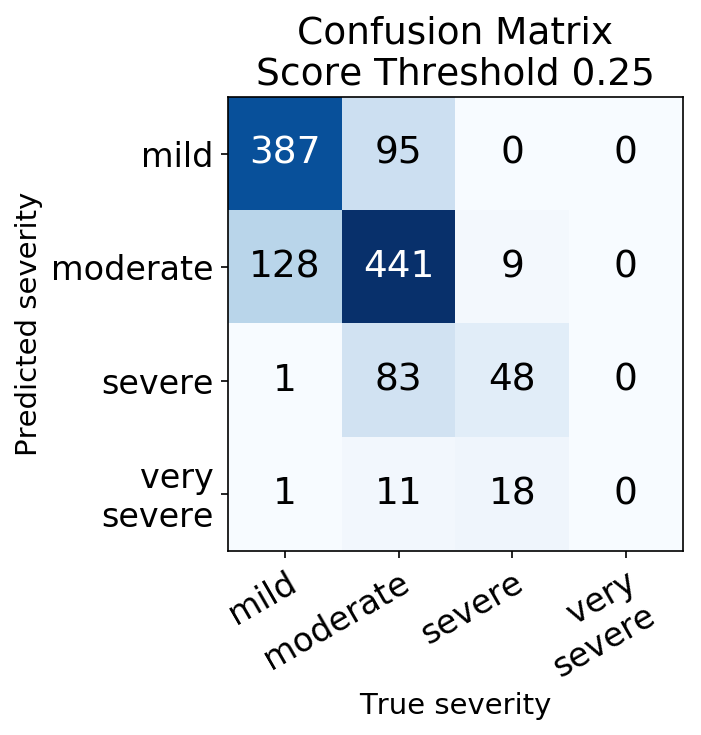

In [ ]:
plot_confusion_matrix(df_ann["severity_level"].values, df_ann["res25_lv"].values, classes=["mild", "moderate", "severe", "very\nsevere"], title="Confusion Matrix\nScore Threshold 0.25")

In [231]:
len(all_fi)

1229

In [232]:
[os.path.basename(item) for item in all_fi if os.path.basename(item) not in df_ann['img_ori_name'].values.tolist()]

['levle0_369.jpg',
 'levle0_431.jpg',
 'levle0_434.jpg',
 'levle0_435.jpg',
 'levle0_445.jpg',
 'levle0_479.jpg',
 'levle0_525.jpg']

In [271]:
import sklearn

sklearn.__version__

'0.20.3'

In [275]:
import matplotlib, pyforest
matplotlib.__version__, pyforest.__version__

('3.0.3', '0.1.4')